# Output area classifications

Classification data from Geographic Data Service (ex CDRC), requires login

TODO quantify frequency of each super/group/sub...

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import geopandas as gpd
import matplotlib.pyplot as plt
import pandas as pd
from matplotlib.gridspec import GridSpec

from spatial import get_force_boundary, map_to_spatial_unit
from utils import extract_crime_data

In [5]:
AREA = "OA"
FORCE = "West Yorkshire"
FILTER = {"Crime type": "Anti-social behaviour"}

In [6]:
raw_crime_data = extract_crime_data(FORCE, filters=FILTER)
boundary = get_force_boundary(FORCE)
crime_data, features = map_to_spatial_unit(raw_crime_data, boundary, AREA)

In [7]:
count_data = crime_data.groupby(["spatial_unit", "Month"])["Crime type"].count().unstack(level="Month").fillna(0)
count_data

Month,2022-06,2022-07,2022-08,2022-09,2022-10,2022-11,2022-12,2023-01,2023-02,2023-03,...,2024-08,2024-09,2024-10,2024-11,2024-12,2025-01,2025-02,2025-03,2025-04,2025-05
spatial_unit,,,,,,,,,,,,,,,,,,,,,
E00053353,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,...,0.0,4.0,0.0,0.0,0.0,1.0,3.0,3.0,0.0,0.0
E00053354,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
E00053356,0.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
E00053357,1.0,2.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,1.0,0.0,2.0,0.0,1.0,0.0,0.0,1.0,0.0
E00053358,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
E00187149,0.0,0.0,0.0,0.0,0.0,1.0,0.0,3.0,1.0,0.0,...,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
E00187150,0.0,1.0,3.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
E00187151,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


In [9]:
oaclasses = pd.read_csv("./data/oac21ew.csv").set_index("oa21cd")
# oaclasses = oaclasses.loc[count_data.index]
oaclasses.supergroup = oaclasses.supergroup.astype(str)
oaclasses

,la23cd,supergroup,group,subgroup
oa21cd,,,,
E00070789,E06000019,1,1a,1a1
E00044550,E08000024,7,7a,7a2
E00044551,E08000024,7,7b,7b2
E00044552,E08000024,1,1b,1b1
E00002123,E09000004,6,6a,6a3
...,...,...,...,...
W00010653,W06000002,2,2b,2b1
W00010655,W06000010,7,7b,7b2
W00010656,W06000010,8,8a,8a2


In [13]:
oadesc = pd.read_csv("./data/classification_codes_and_names-1.csv")
oadesc["Classification Code"] = oadesc["Classification Code"].str.strip()
oadesc = oadesc.set_index("Classification Code")
oadesc

,CDRC Products,Level,Level Code,Classification Name
Classification Code,,,,
1,2021 OAC and UK-OAC,Supergroup,sg,Retired Professionals
2,2021 OAC and UK-OAC,Supergroup,sg,Suburbanites and Peri-Urbanites
3,2021 OAC and UK-OAC,Supergroup,sg,Multicultural and Educated Urbanites
4,2021 OAC and UK-OAC,Supergroup,sg,Low-Skilled Migrant and Student Communities
5,2021 OAC and UK-OAC,Supergroup,sg,Ethnically Diverse Suburb-an Professionals
...,...,...,...,...
8a1,2021 OAC and UK-OAC,Subgroup,subg,Retirement Residences
8a2,2021 OAC and UK-OAC,Subgroup,subg,Flats and Routine Occupations
8b1,2021 OAC and UK-OAC,Subgroup,subg,Challenged Families


In [14]:
rank = count_data["2025-05"].sort_values().cumsum() / count_data["2025-05"].sum()
rank = rank[rank > 0.75].sort_values(ascending=False)
rank = oaclasses.drop(columns="la23cd").join(rank, how="right")
rank

,supergroup,group,subgroup,2025-05
spatial_unit,,,,
E00169797,3,3a,3a2,1.000000
E00057556,1,1a,1a1,0.991858
E00169788,3,3a,3a1,0.985841
E00055022,2,2b,2b2,0.979823
E00059447,2,2c,2c2,0.975221
...,...,...,...,...
E00055049,6,6b,6b3,0.756460
E00058352,8,8b,8b3,0.755044
E00057907,6,6a,6a1,0.753628


In [15]:
# supergroups
supergroup = rank.groupby("supergroup")["2025-05"].count().sort_values(ascending=False).to_frame()
supergroup["desc"] = supergroup.index.map(oadesc["Classification Name"])
supergroup

,2025-05,desc
supergroup,,
3,23,Multicultural and Educated Urbanites
7,23,Semi- and Un-Skilled Workforce
6,18,Baseline UK
4,17,Low-Skilled Migrant and Student Communities
2,16,Suburbanites and Peri-Urbanites
5,9,Ethnically Diverse Suburb-an Professionals
8,4,Legacy Communities
1,2,Retired Professionals


In [16]:
# groups
group = rank.groupby("group")["2025-05"].count().sort_values(ascending=False).to_frame()
group["desc"] = group.index.map(oadesc["Classification Name"])
group

,2025-05,desc
group,,
7a,13,Established but Challenged
3a,12,Student Living and Professional Footholds
4c,11,Challenged Multicultural Communities and Students
7b,10,Young Families in Industrial Towns
6a,10,Challenged Communities
3b,8,Ethnically Diverse Young Families
6b,8,Legacy Industrial and Coastal Communities
5b,7,Suburban Professionals
2b,6,Rural Amenity


In [17]:
# subgroups
subgroup = rank.groupby("subgroup")["2025-05"].count().sort_values(ascending=False).to_frame()
subgroup["desc"] = subgroup.index.map(oadesc["Classification Name"])
subgroup

,2025-05,desc
subgroup,,
7a2,13,Industry Associations
4c2,10,European and Asian Heritage
7b1,9,Terraces in Transitional Towns
3b1,7,Private Rental Ethnic Minority Families
3a1,6,University Centric
2c2,5,Ageing Independent Living
5b1,5,Families in Multi-Ethnic Terraces
6a1,4,Suburban Housing Starters
6a2,4,Semi Detached Strivers


In [18]:
rank["supergroup_desc"] = rank.supergroup.map(oadesc["Classification Name"])
rank["group_desc"] = rank.group.map(oadesc["Classification Name"])
rank["subgroup_desc"] = rank.subgroup.map(oadesc["Classification Name"])
rank

,supergroup,group,subgroup,2025-05,supergroup_desc,group_desc,subgroup_desc
spatial_unit,,,,,,,
E00169797,3,3a,3a2,1.000000,Multicultural and Educated Urbanites,Student Living and Professional Footholds,Professional Progression
E00057556,1,1a,1a1,0.991858,Retired Professionals,Spacious Rural Living,Pre-Retirement Spacious Living
E00169788,3,3a,3a1,0.985841,Multicultural and Educated Urbanites,Student Living and Professional Footholds,University Centric
E00055022,2,2b,2b2,0.979823,Suburbanites and Peri-Urbanites,Rural Amenity,Rural Mix
E00059447,2,2c,2c2,0.975221,Suburbanites and Peri-Urbanites,Ageing Communities,Ageing Independent Living
...,...,...,...,...,...,...,...
E00055049,6,6b,6b3,0.756460,Baseline UK,Legacy Industrial and Coastal Communities,EU Singles
E00058352,8,8b,8b3,0.755044,Legacy Communities,Legacy and Demographically Mixed Communities,Young Families and Neighbourhood Turnover
E00057907,6,6a,6a1,0.753628,Baseline UK,Challenged Communities,Suburban Housing Starters


In [13]:
features.join(oaclasses).explore("subgroup", tiles="CartoDB positron")

In [19]:
counts = oaclasses.join(count_data.sum(axis=1).rename("total"), how="right")
counts

,la23cd,supergroup,group,subgroup,total
spatial_unit,,,,,
E00053353,E08000032,1,1a,1a2,20.0
E00053354,E08000032,2,2c,2c2,2.0
E00053356,E08000032,2,2c,2c2,13.0
E00053357,E08000032,1,1b,1b1,19.0
E00053358,E08000032,2,2c,2c2,1.0
...,...,...,...,...,...
E00187149,E08000035,6,6c,6c1,13.0
E00187150,E08000035,2,2a,2a1,11.0
E00187151,E08000035,3,3a,3a4,4.0


Text(0, 0.5, '')

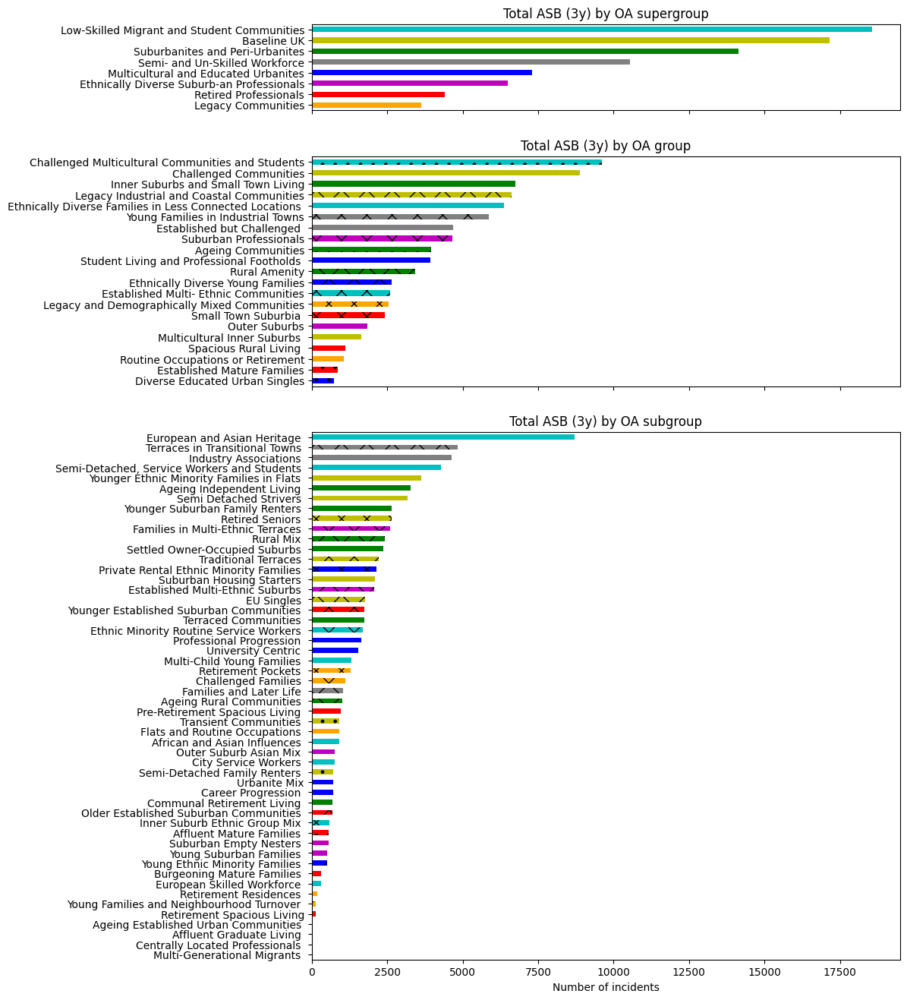

In [20]:
n = [len(oaclasses.supergroup.unique()), len(oaclasses.group.unique()), len(oaclasses.subgroup.unique())]

spacing = 4
b = [(sum(n[:i]) + spacing * i, sum(n[: i + 1]) + spacing * i) for i in range(3)]

colours = ["", "r", "g", "b", "c", "m", "y", "grey", "orange"]
patterns = {"a": "", "b": "x", "c": "."}

fig = plt.figure(figsize=(10, 16))
gs = GridSpec(sum(n) + 4, 1, figure=fig)
ax = fig.add_subplot(gs[0 : b[0][1]])
axs = [ax, *(fig.add_subplot(gs[b0:b1], sharex=ax) for b0, b1 in b[1:])]
sup_counts = counts.groupby("supergroup").total.sum().sort_values()
colour = [colours[int(i)] for i in sup_counts.index]
sup_counts.index = sup_counts.index.map(oadesc["Classification Name"])
sup_counts.plot.barh(x="total", title="Total ASB (3y) by OA supergroup", color=colour, ax=axs[0])
axs[0].set_ylabel(None)

grp_counts = counts.groupby("group").total.sum().sort_values()
colour = [colours[int(i[0])] for i in grp_counts.index]
hatch = [patterns[i[1]] for i in grp_counts.index]
grp_counts.index = grp_counts.index.map(oadesc["Classification Name"])
grp_counts.plot.barh(title="Total ASB (3y) by OA group", color=colour, hatch=hatch, ax=axs[1])
axs[1].set_ylabel(None)

sub_counts = counts.groupby("subgroup").total.sum().sort_values()
colour = [colours[int(i[0])] for i in sub_counts.index]
hatch = [patterns[i[1]] for i in sub_counts.index]
sub_counts.index = sub_counts.index.map(oadesc["Classification Name"])
sub_counts.plot.barh(title="Total ASB (3y) by OA subgroup", color=colour, hatch=hatch, ax=axs[2])
axs[2].set_xlabel("Number of incidents")
axs[2].set_ylabel(None)

In [21]:
subgroup_code = "8b2"
"/".join(oadesc.loc[[subgroup_code[: i + 1] for i in range(len(subgroup_code))], "Classification Name"])

'Legacy Communities/Legacy and Demographically Mixed Communities/Retirement Pockets '

## IMD

LSOA level. See https://communitiesopendata-communities.hub.arcgis.com/search?q=IMD

- IMD
- Inc: income
- Emp: employment
- Edu: education/skills/training
- HDD: health deprivation and disability
- Cri: crime (violence/burglary/theft/criminal damage)
- BHS: barriers to housing and services
- Env: living environment deprivation
- IDC: income deprivation affecting children?
- IDO: income deprivation affecting older people?
- CYP: children and young people?
- ASS: ?
- GB: ?
- WB: ?
- Ind: ?
- Out: ?

In [22]:
# could just use PFA23NM
imd = (
    gpd.read_file("./data/Indices_of_Multiple_Deprivation_(IMD)_2019.geojson")
    .to_crs(epsg=27700)
    .set_index("lsoa11cd")
    .sjoin(boundary, how="inner")
)

In [24]:
imd.explore("IMD_Decile", tiles="CartoDB positron")